# Evaluation vorticity GCMx -> 2.2km-4x over Birmingham
ST: means using shared xfms from training so both iput and target xfms are based on CPM training data
Otherwise models share a target xfm based on CPM dataset but do a per dataset input xfm.

64x64 pixel target

Includes version with 8-channel location-specific parameters and versions with not locations-specific parameters.

## Diff model

Vorticity transform: standardize (based on train set mean and std) then devide by standardized train set max

Target transform: sqrt then divide by sqrted train set max

Sample inverse transform: multiply by train set max, clip negative values to 0 then square

In [1]:
%reload_ext autoreload

%autoreload 2

import math
import os

import iris
import iris.analysis.cartography
import IPython
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from ml_downscaling_emulator import UKCPDatasetMetadata
from ml_downscaling_emulator.helpers import plot_over_ts
from ml_downscaling_emulator.utils import cp_model_rotated_pole, platecarree, plot_grid, prep_eval_data, show_samples, distribution_figure, plot_mean_bias, plot_std, plot_psd

In [2]:
split = "val"

datasets = {
    "CPM": "2.2km-coarsened-gcm-2.2km-coarsened-4x_birmingham_vorticity850_random",
    "GCM": "60km-2.2km-coarsened-4x_birmingham_vorticity850_random",
}

runs = [
    # ("bham-4x_V850_random", 20, "V850 no-LS"),
    # ("bham-4x_V850_random-shared-xfms", 20, "V850 no-LS ST"),
    ("bham-4x_V850_random-ls8", 20, "V850 LS8"),
    ("bham-4x_V850_random-ls8-shared-xfms", 20, "V850 LS8 ST"),
    
    ("bham-4x_V850_random-ls8-IPTP", 20, "V850 IPTP"),
    ("bham-4x_V850_random-ls8-IPTS", 20, "V850 IPTS"),
    ("bham-4x_V850_random-ls8-ISTS", 20, "V850 ISTS"),
]

In [3]:
merged_ds = prep_eval_data(datasets, runs, split)

assert merged_ds["target_pr"].isnull().sum().values == 0
assert merged_ds["pred_pr"].isnull().sum().values == 0

merged_ds

<xarray.Dataset>
Dimensions:                     (time: 4320, grid_latitude: 64,
                                 grid_longitude: 64, sample_id: 3, model: 5,
                                 source: 2, bnds: 2)
Coordinates:
    pressure                    (time) float32 850.0 850.0 850.0 ... 850.0 850.0
  * time                        (time) object 1980-12-03 12:00:00 ... 2080-11...
  * grid_latitude               (grid_latitude) float32 -2.49 -2.41 ... 2.55
  * grid_longitude              (grid_longitude) float32 357.9 358.0 ... 363.0
  * sample_id                   (sample_id) int64 0 1 2
  * model                       (model) object 'V850 IPTP' ... 'V850 LS8 ST'
    season                      (time) int64 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3
  * source                      (source) object 'CPM' 'GCM'
Dimensions without coordinates: bnds
Data variables:
    rotated_latitude_longitude  (source, model, sample_id, time) float64 -2.1...
    time_bnds                   (source, model, sample_id, time, bnds) object ...
    grid_latitude_bnds          (source, model, sample_id, time, grid_latitude, bnds) float32 ...
    grid_longitude_bnds         (source, model, sample_id, time, grid_longitude, bnds) float32 ...
    pred_pr                     (source, model, sample_id, time, grid_latitude, grid_longitude) float32 ...
    target_pr                   (source, time, grid_latitude, grid_longitude) float32 ...
    vorticity850                (source, time, grid_latitude, grid_longitude) float64 ...

In [4]:
total_target_pr = merged_ds["target_pr"].sel(source="CPM").mean(dim=["grid_longitude", "grid_latitude"])

## Samples

In [5]:
sorted_time = total_target_pr.sortby(total_target_pr)["time"].values

Timestep chunk 0

CPM

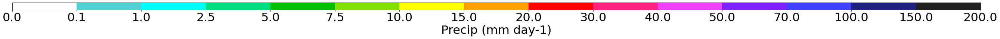

V850 IPTP

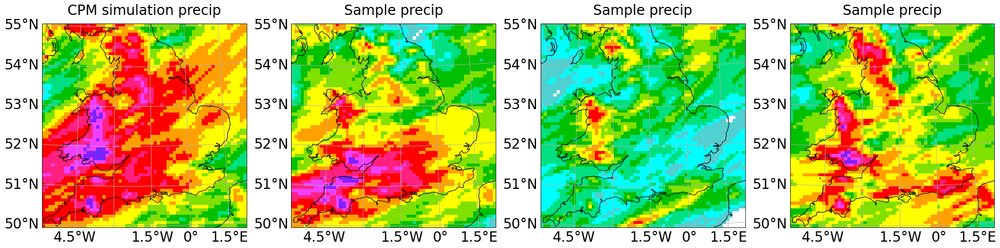

V850 IPTS

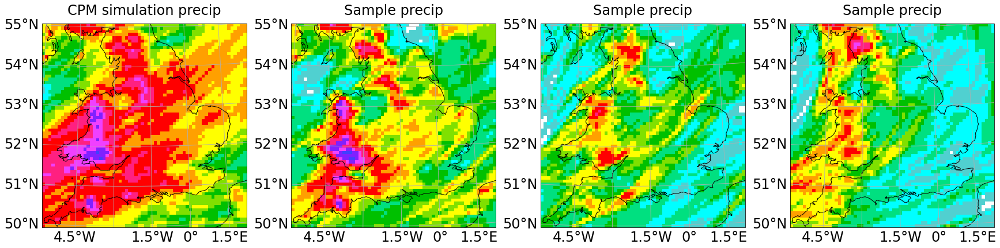

V850 ISTS

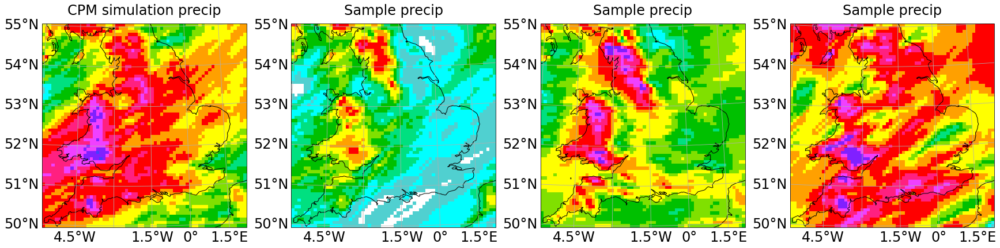

V850 LS8

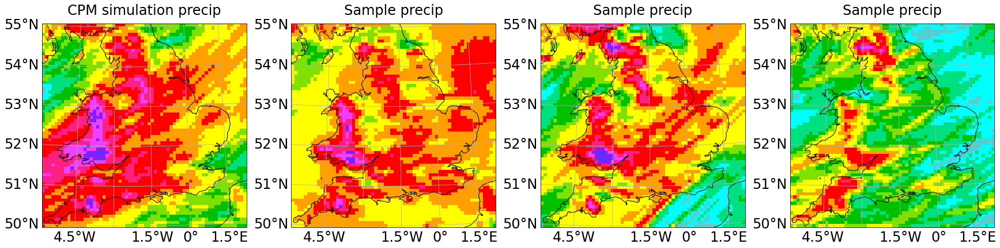

V850 LS8 ST

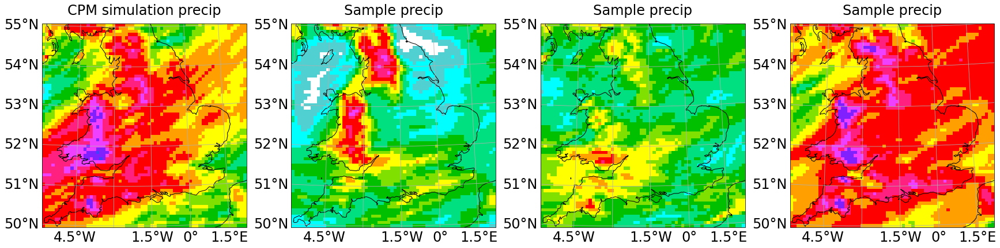

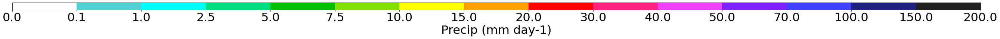

V850 IPTP

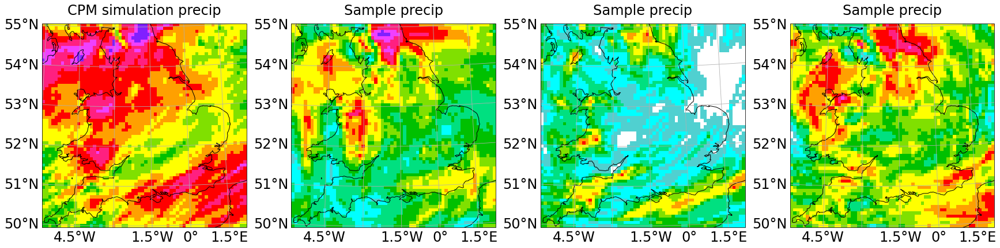

V850 IPTS

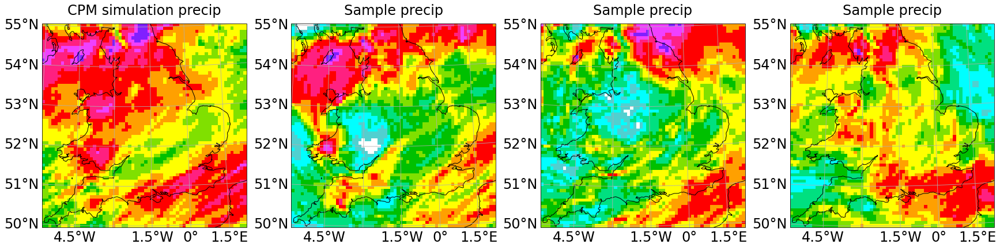

V850 ISTS

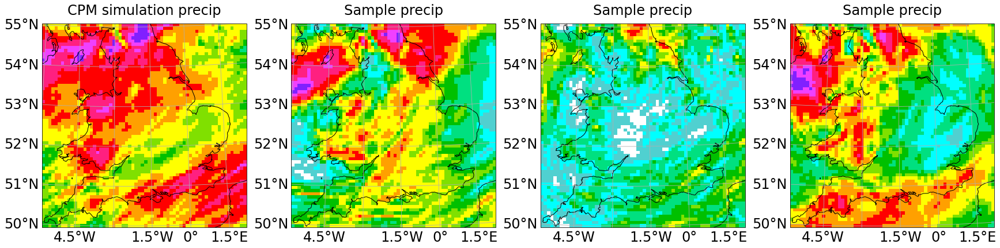

V850 LS8

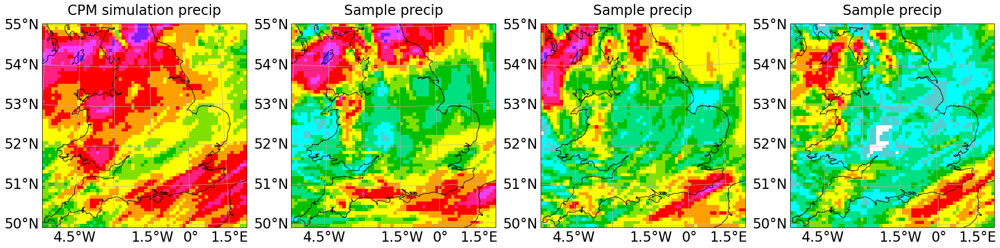

V850 LS8 ST

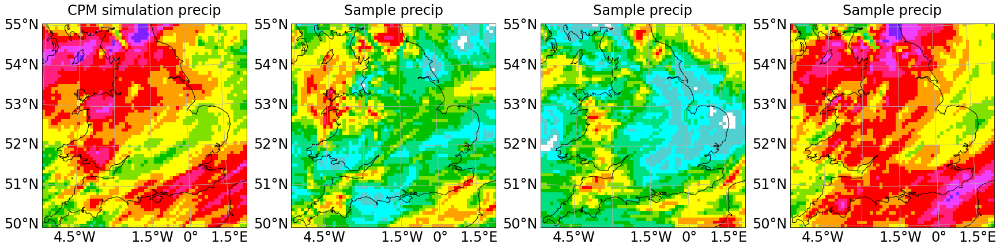

GCM

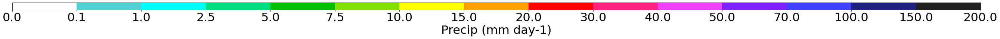

V850 IPTP

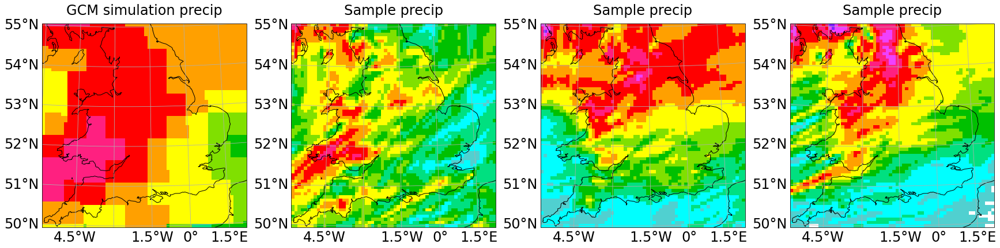

V850 IPTS

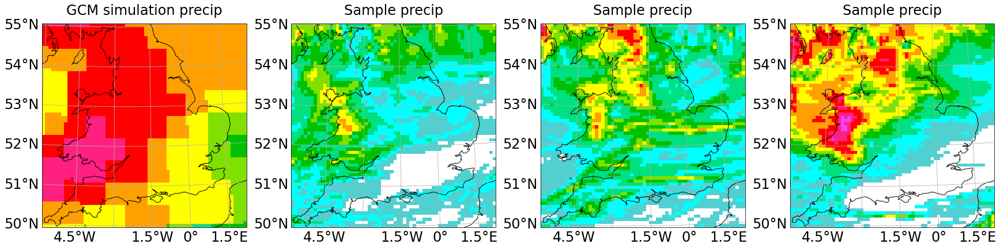

V850 ISTS

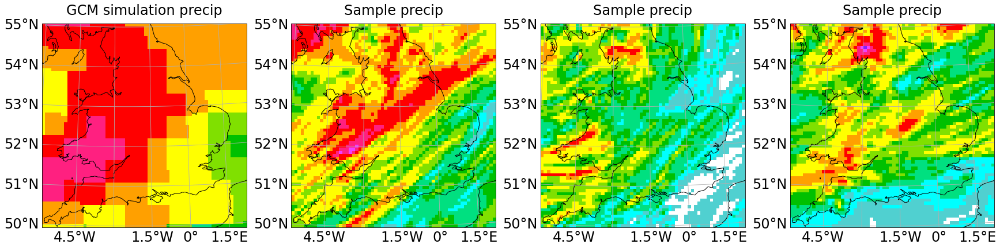

V850 LS8

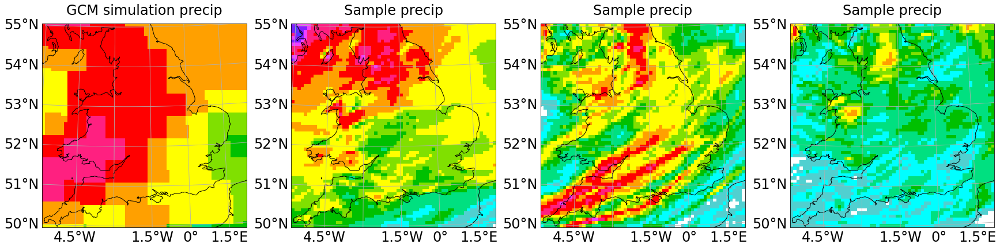

V850 LS8 ST

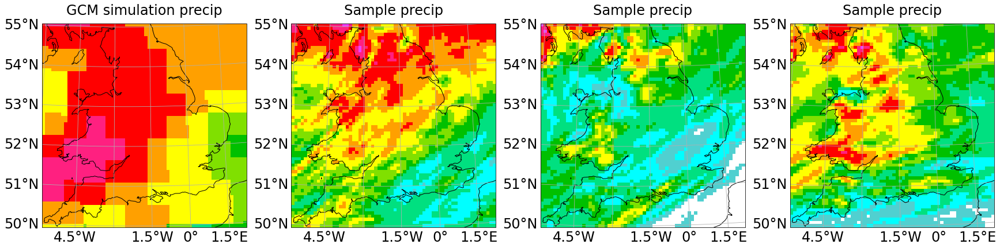

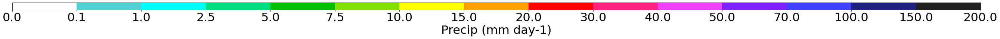

V850 IPTP

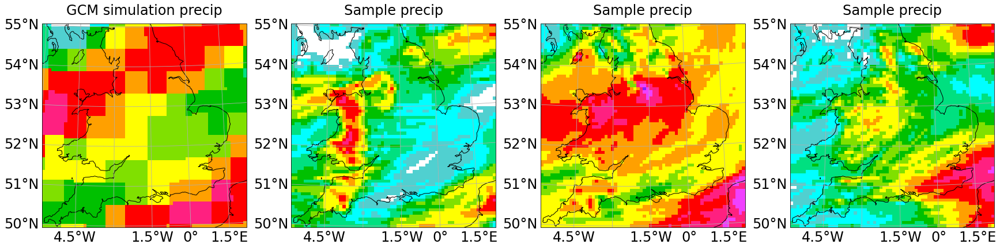

V850 IPTS

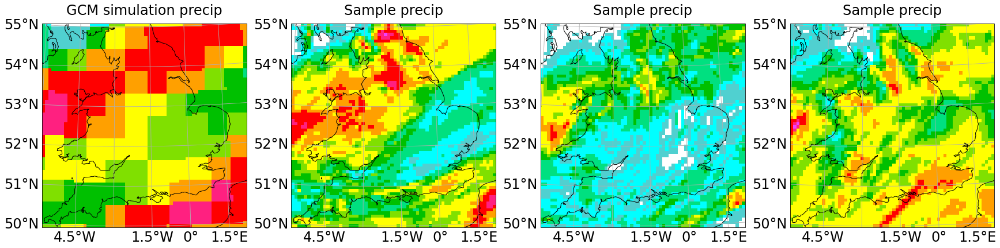

V850 ISTS

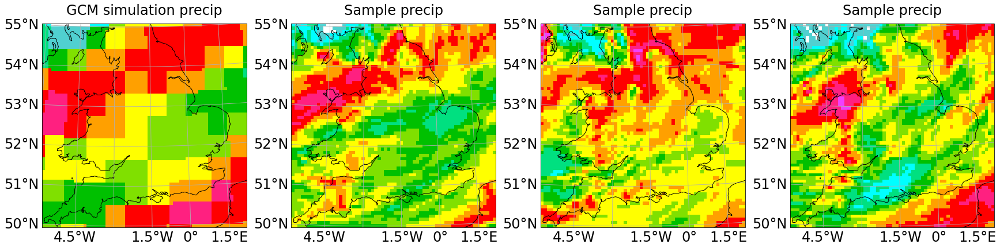

V850 LS8

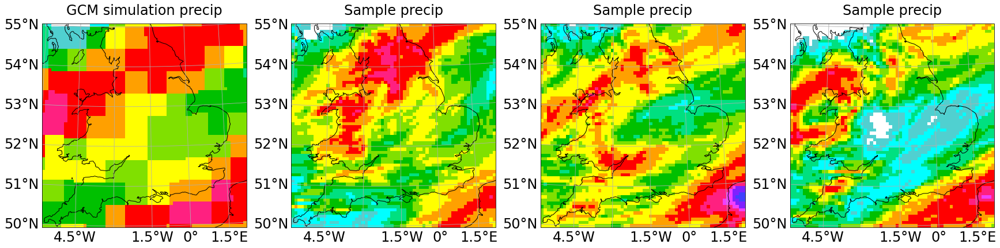

V850 LS8 ST

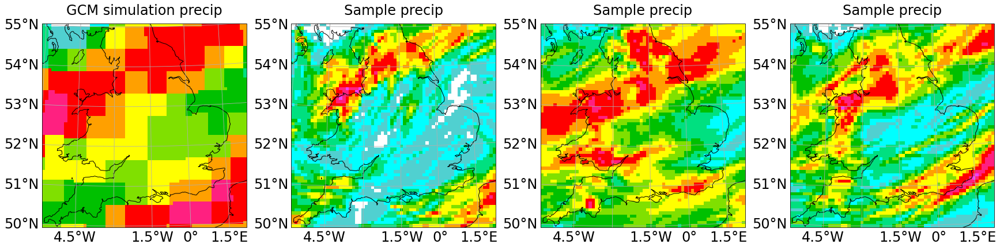

Timestep chunk 1

CPM

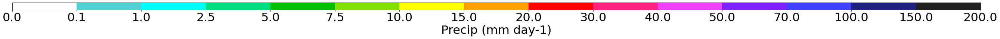

V850 IPTP

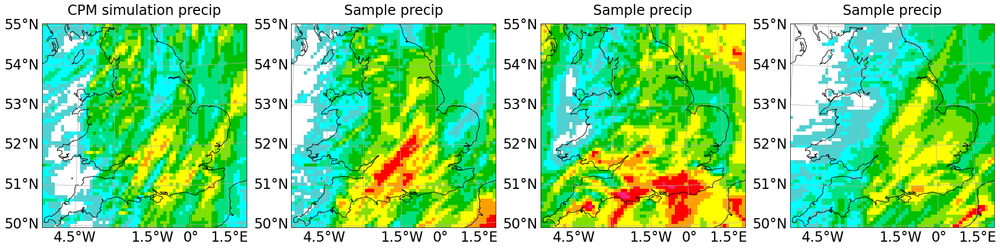

V850 IPTS

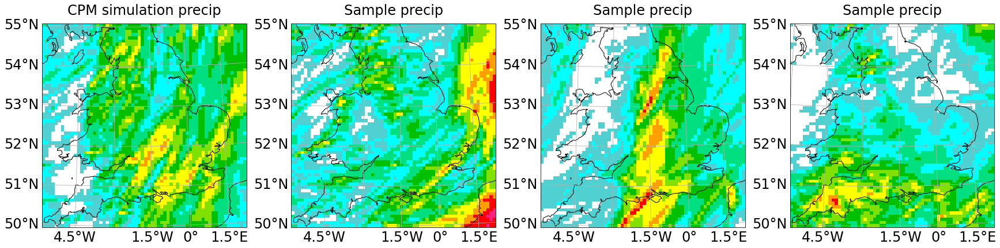

V850 ISTS

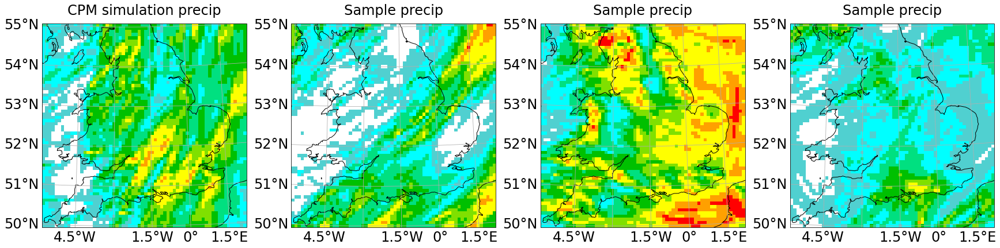

V850 LS8

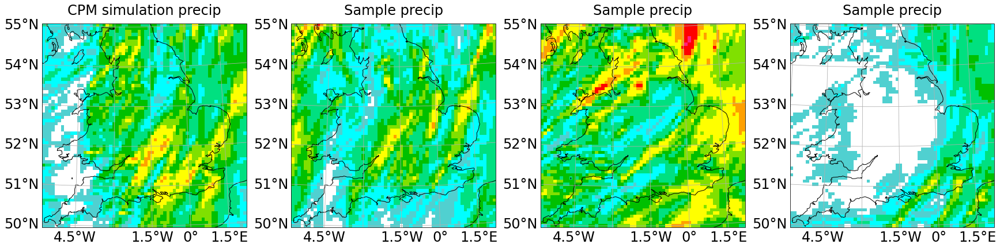

V850 LS8 ST

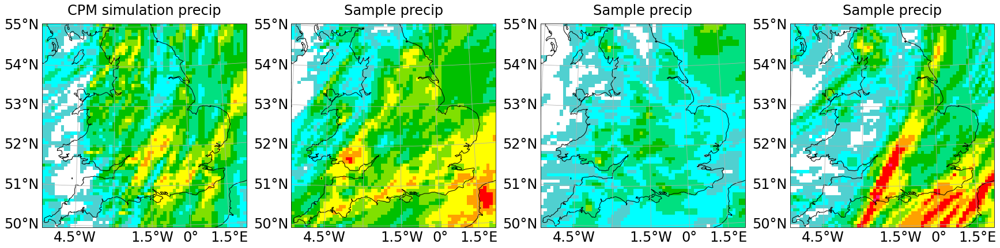

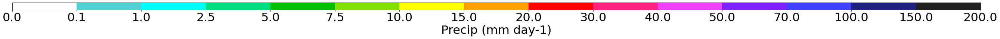

V850 IPTP

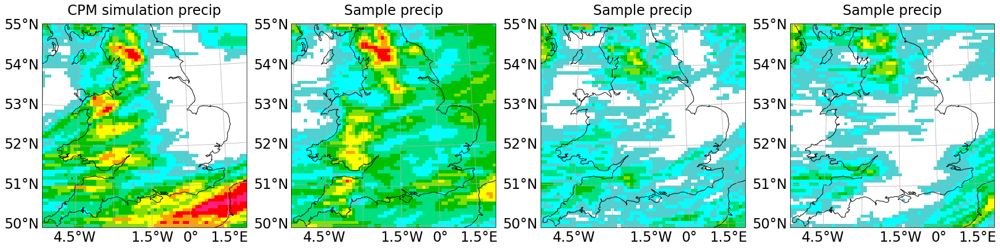

V850 IPTS

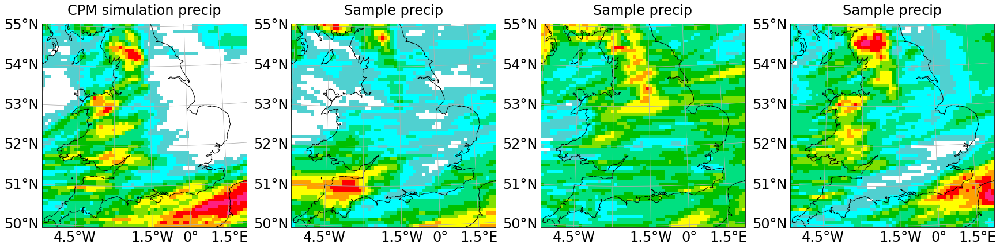

V850 ISTS

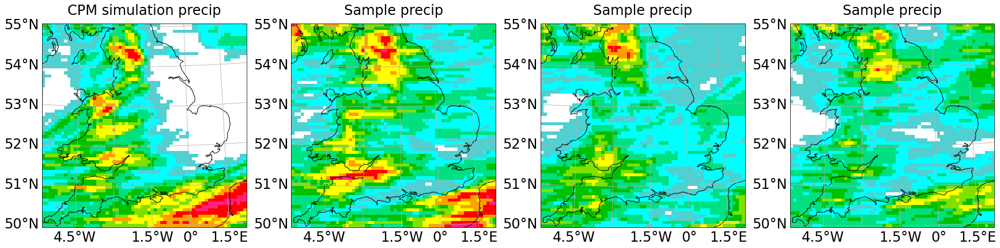

V850 LS8

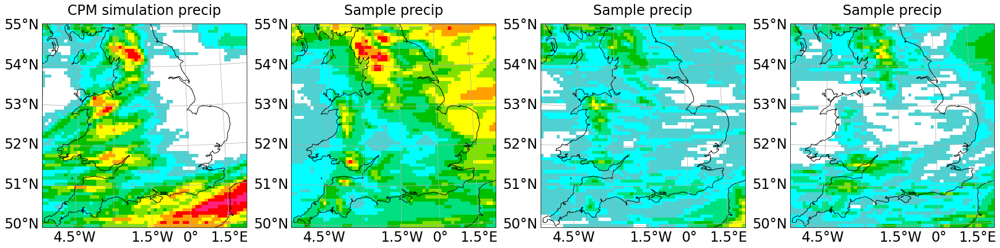

V850 LS8 ST

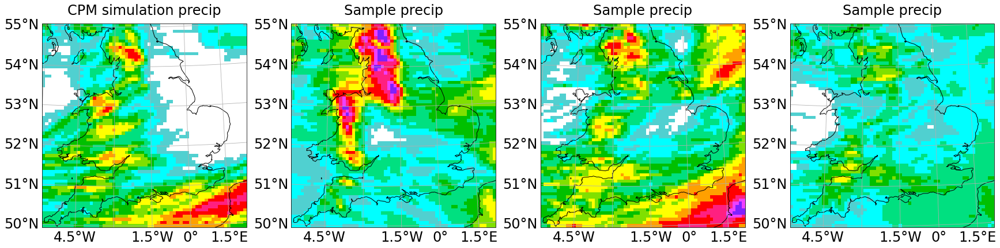

GCM

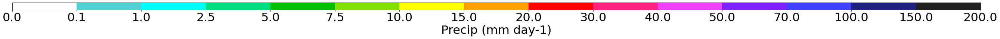

V850 IPTP

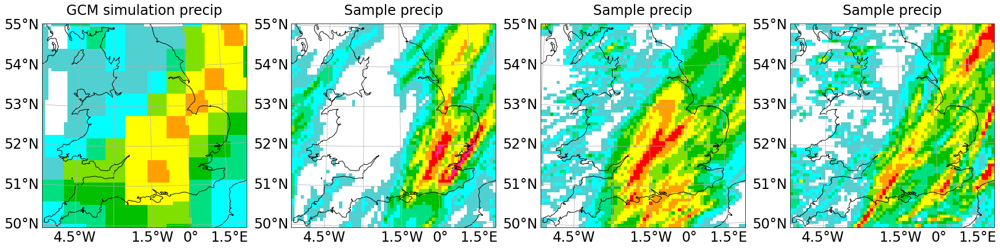

V850 IPTS

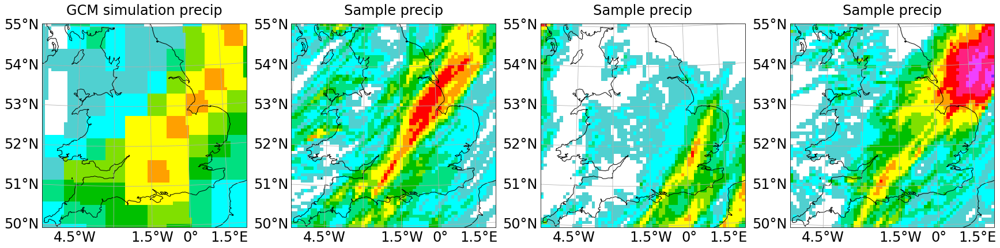

V850 ISTS

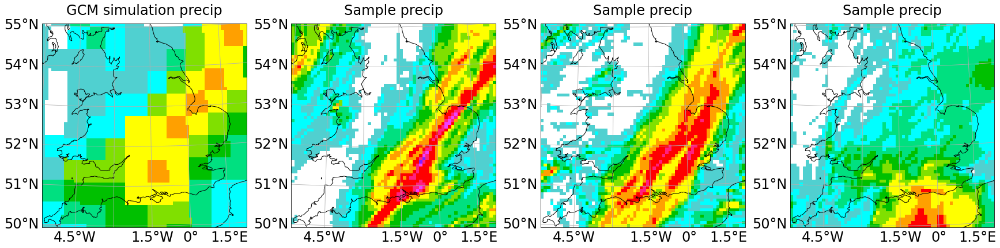

V850 LS8

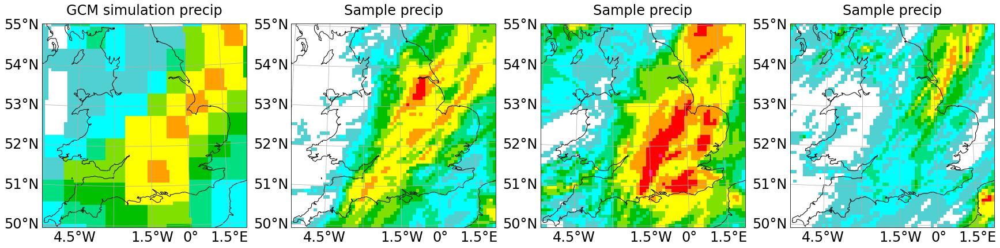

V850 LS8 ST

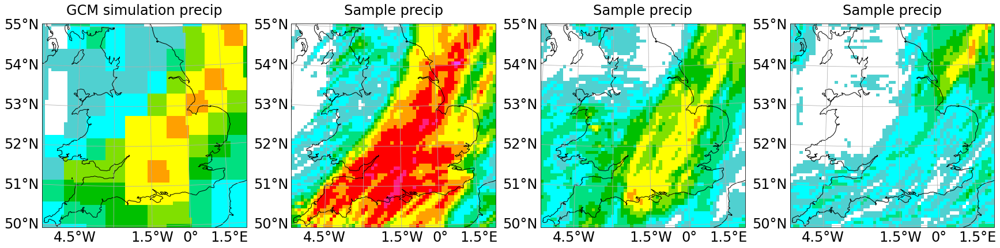

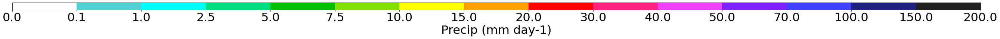

V850 IPTP

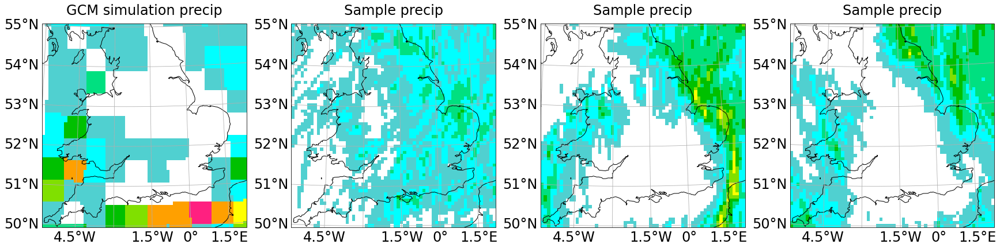

V850 IPTS

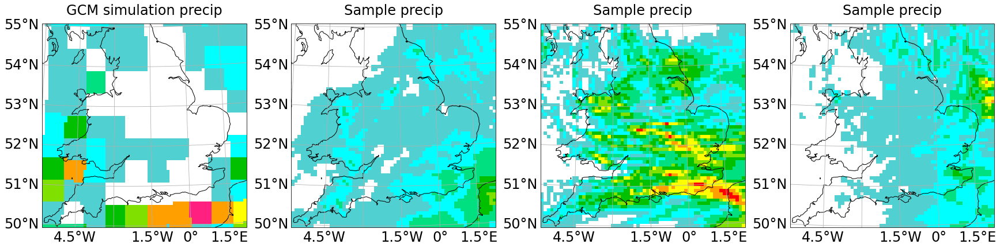

V850 ISTS

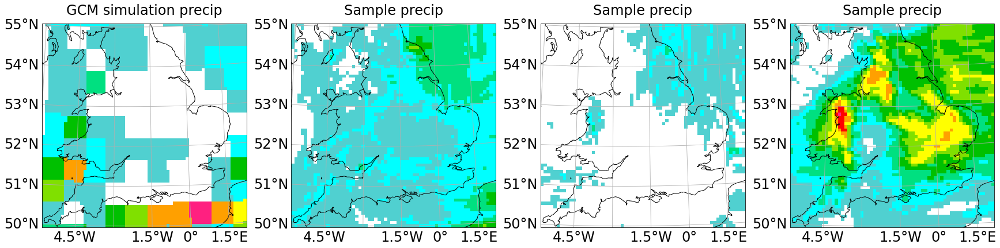

V850 LS8

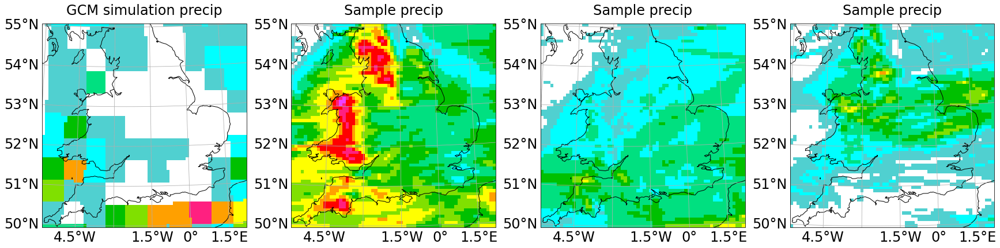

V850 LS8 ST

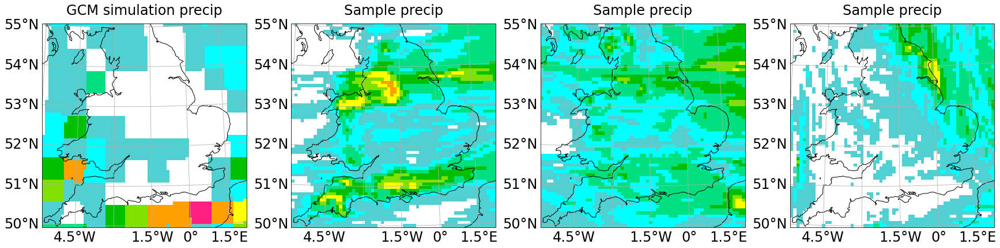

In [6]:
timestamp_chunks = [
    sorted_time[t:t+2] for t in [
        -20, 
        # math.ceil(len(sorted_time)*0.9),
        math.ceil(len(sorted_time)*0.81),
        # math.ceil(len(sorted_time)*0.5), 
        # 17
    ]
]
# timestamps = np.random.choice(sorted_time, size=2*3, replace=False)

for i, timestamps in enumerate(timestamp_chunks):
    IPython.display.display_html(f"<h1>Timestep chunk {i}</h1>", raw=True)
    show_samples(merged_ds, timestamps)

## Frequency distribution

### Pixel

CPM

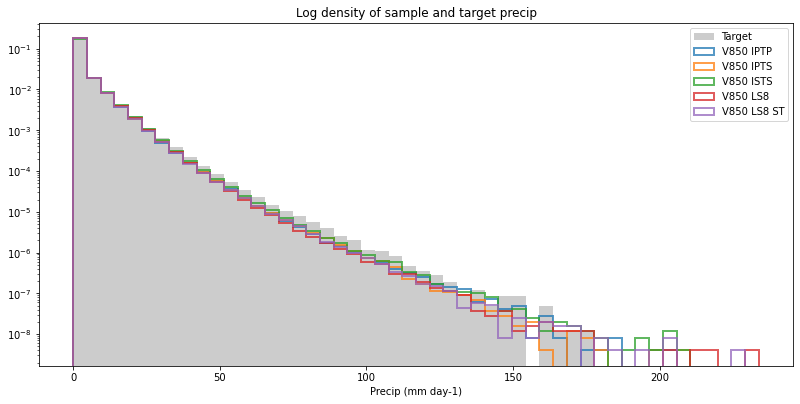

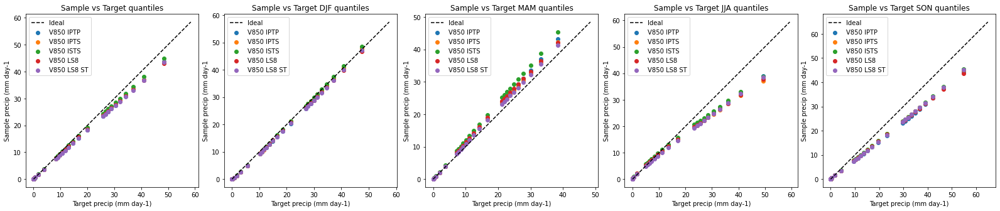

GCM

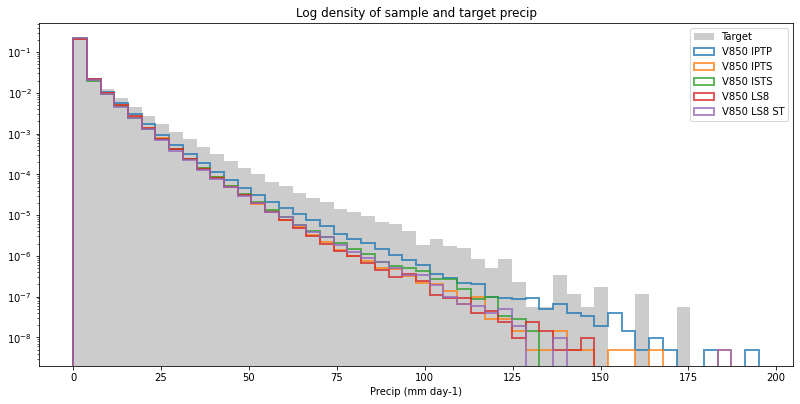

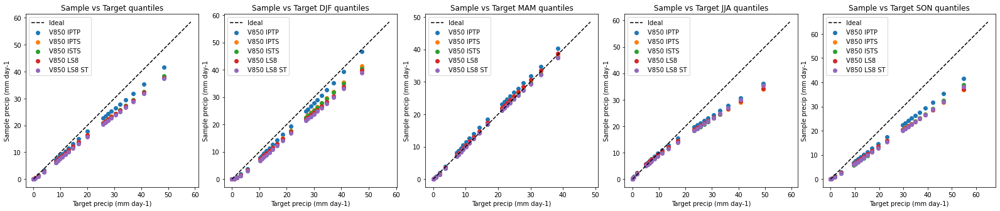

In [7]:
quantiles = np.concatenate([np.linspace(0.1,0.8,8), np.linspace(0.9,0.99,10), np.linspace(0.991,0.999,9)])

distribution_figure(merged_ds, quantiles, "Distribution of pixel values")

In [8]:
for source in merged_ds["source"].values:
    for season, seasonal_ds in merged_ds.groupby('time.season'):
        print(seasonal_ds.sel(source=source)["pred_pr"].isnull().sum().values)
        print(seasonal_ds["pred_pr"].sel(source="GCM").isnull().sum().values)

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


### Mean over space

CPM

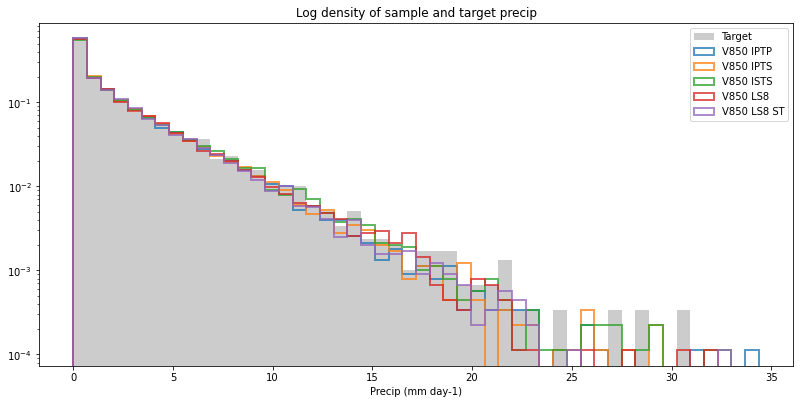

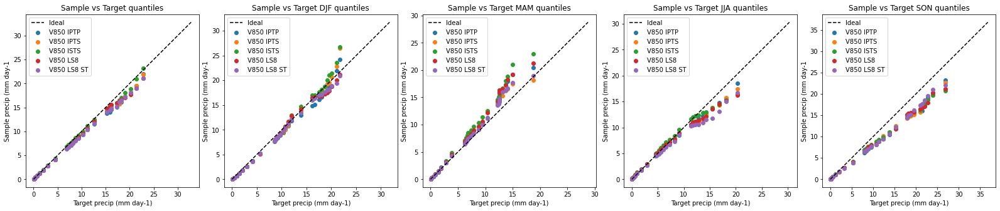

GCM

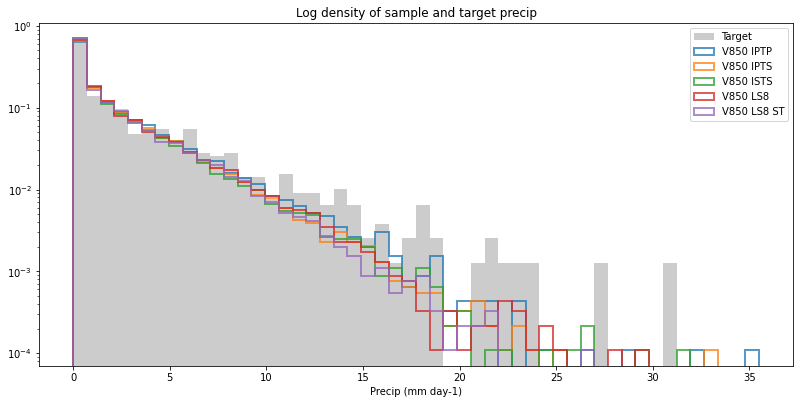

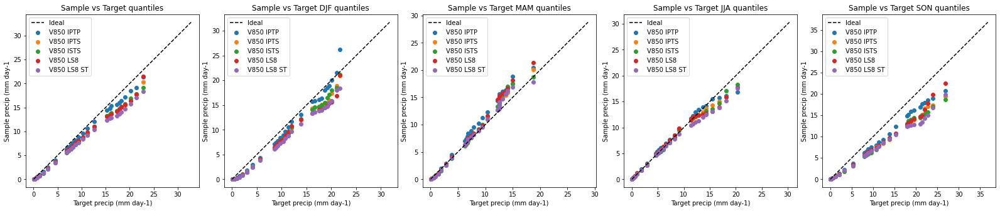

In [9]:
quantiles = np.concatenate([np.linspace(0.1,0.8,8), np.linspace(0.9,0.99,10), np.linspace(0.991,0.999,9)])

distribution_figure(merged_ds[["target_pr", "pred_pr"]].mean(dim=["grid_longitude", "grid_latitude"]), quantiles, "Distribution of mean precip over space")

## Bias

Bias/Target mean

All

CPM

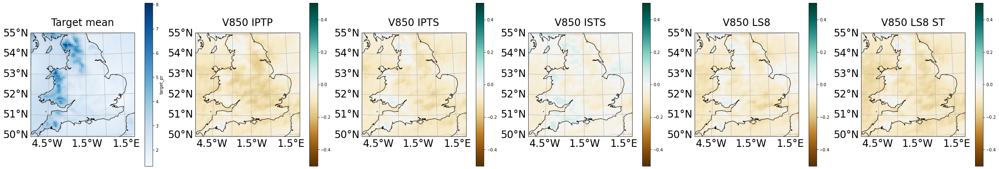

GCM

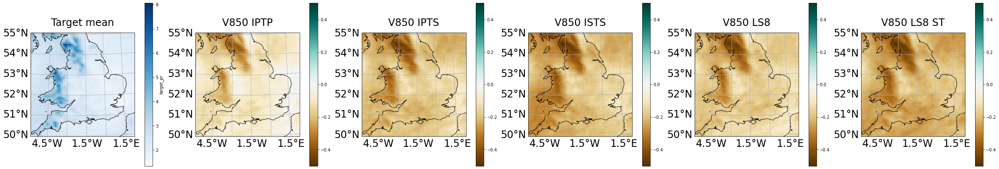

Season DJF

CPM

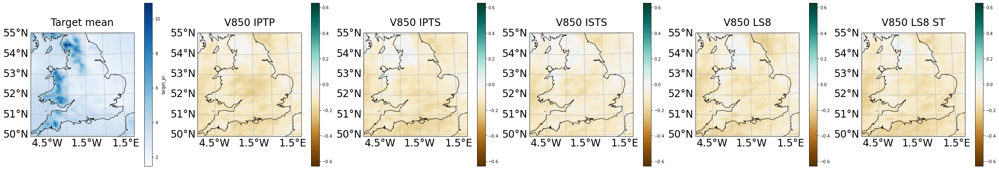

GCM

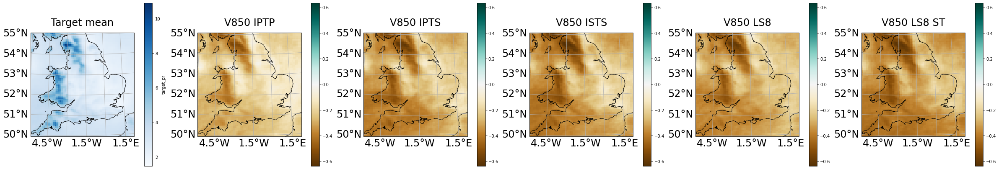

Season JJA

CPM

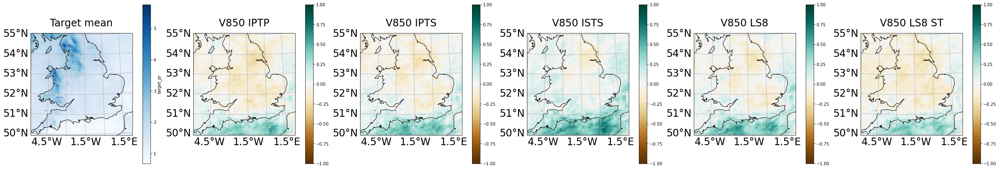

GCM

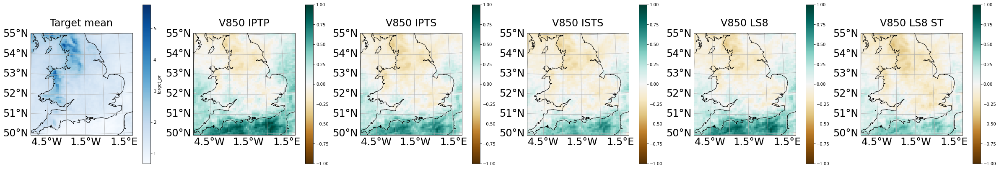

Season MAM

CPM

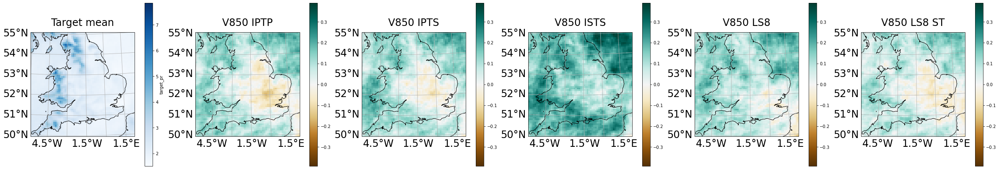

GCM

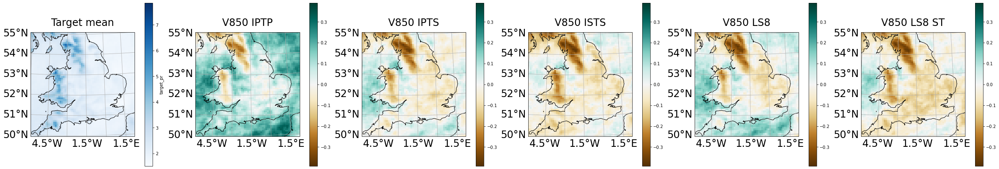

Season SON

CPM

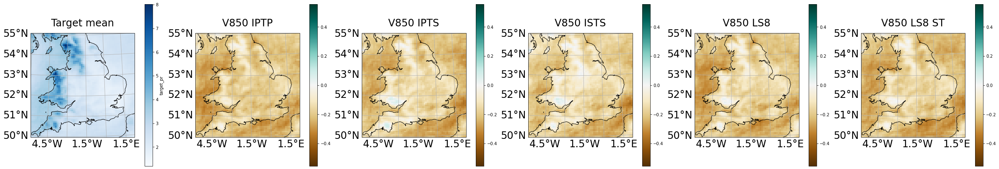

GCM

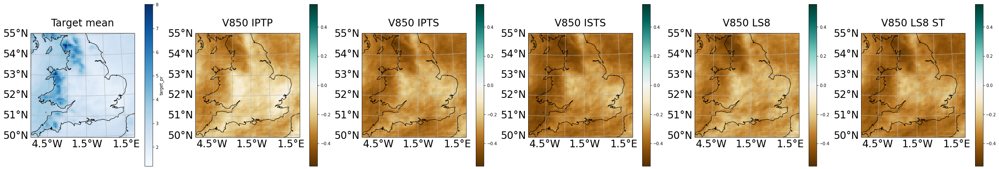

In [10]:
plot_mean_bias(merged_ds)

## Standard deviation

CPM

V850 IPTP

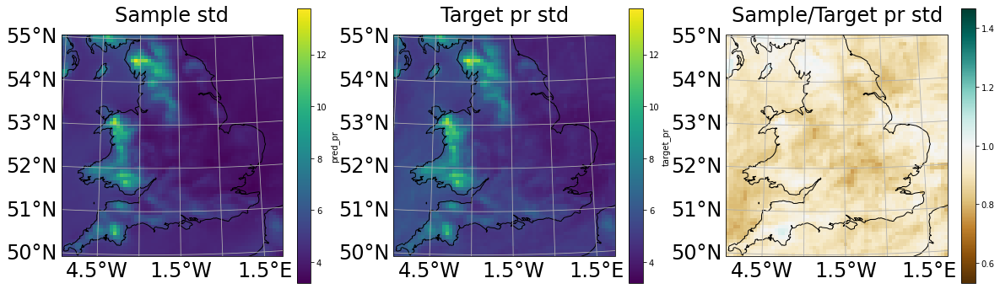

V850 IPTS

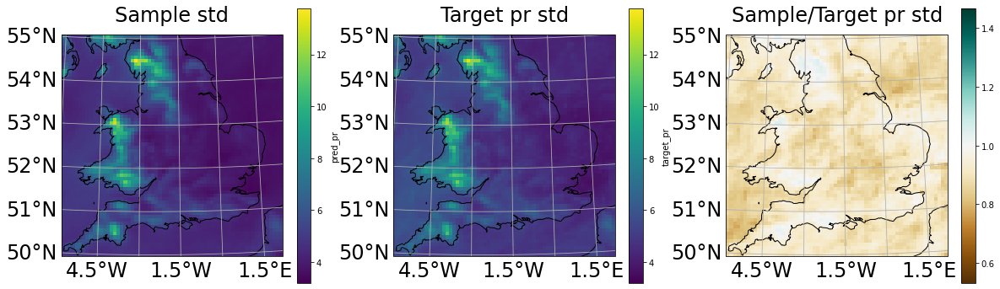

V850 ISTS

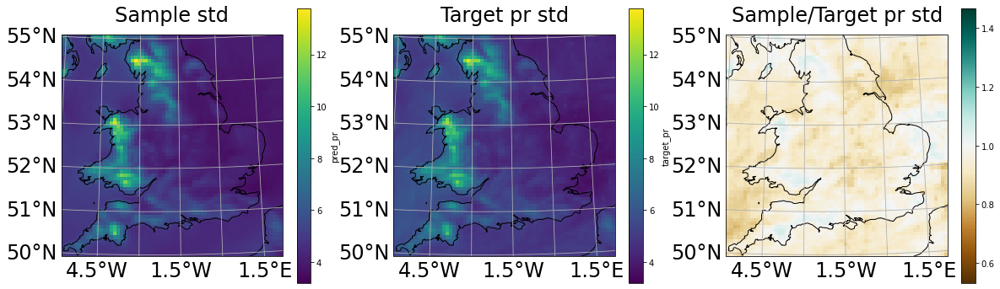

V850 LS8

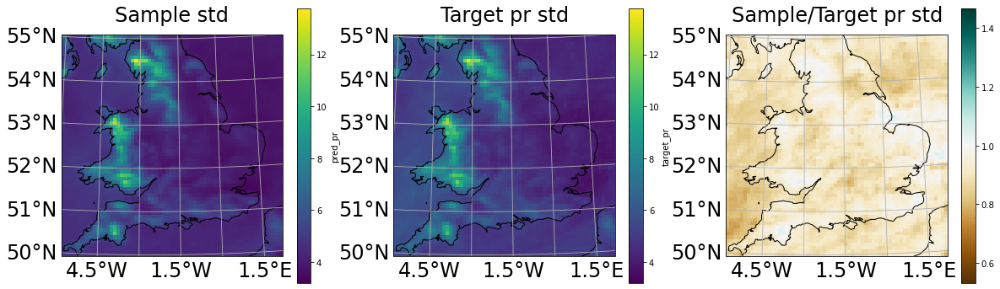

V850 LS8 ST

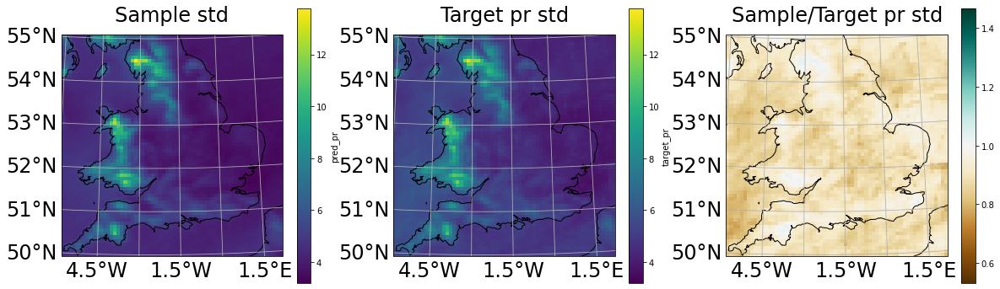

GCM

V850 IPTP

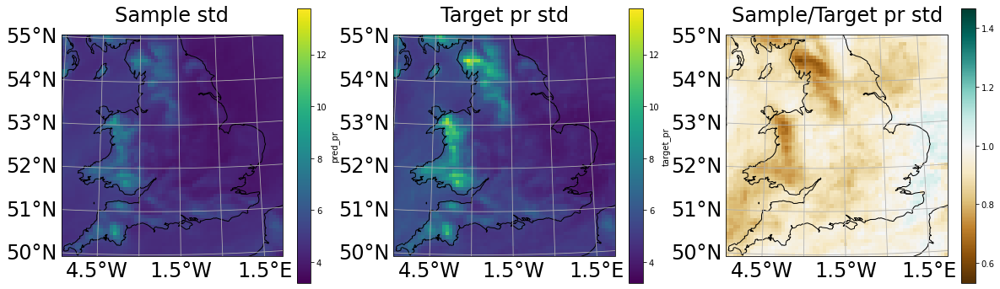

V850 IPTS

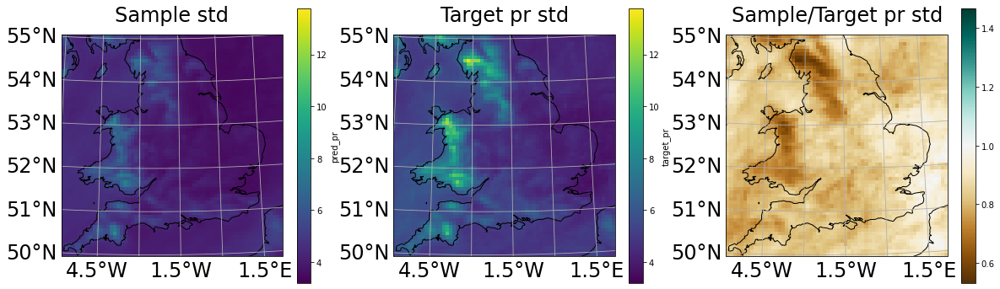

V850 ISTS

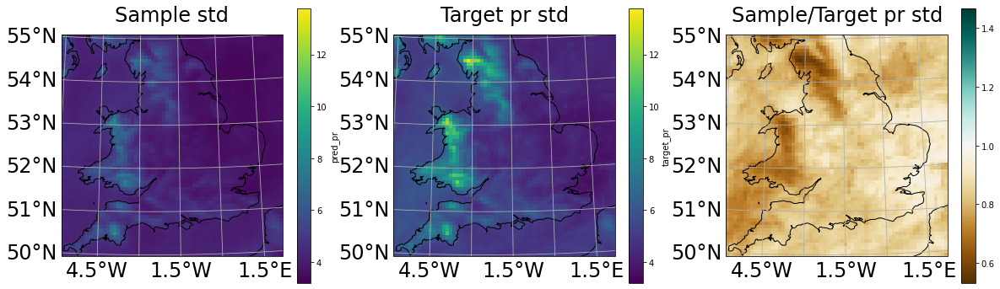

V850 LS8

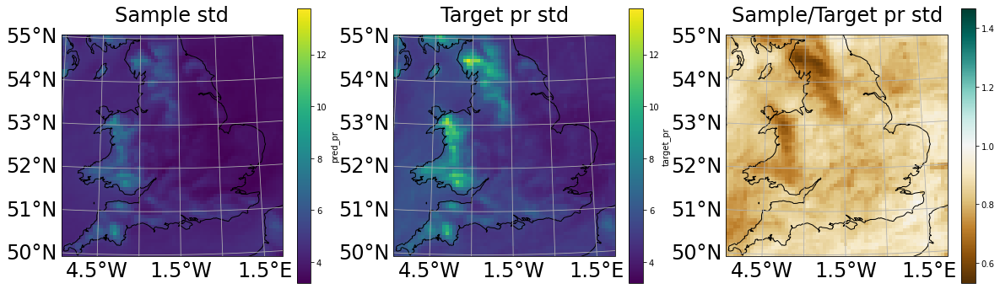

V850 LS8 ST

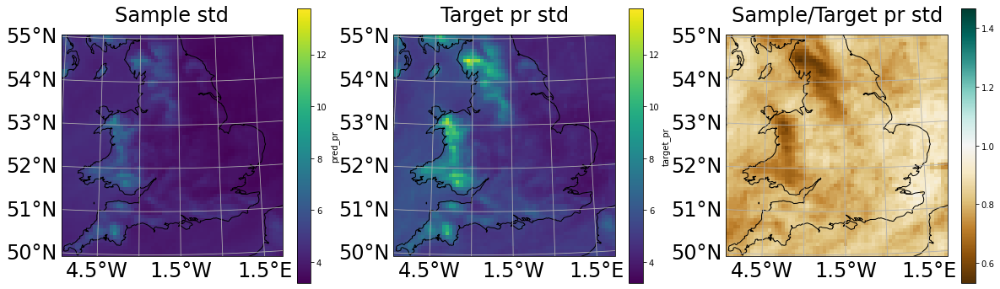

In [11]:
plot_std(merged_ds)

## Scatter

In [12]:
# fig, axs = plt.subplots(1, 1, figsize=(20, 6))

# tr = min(merged_ds["pred_pr"].max(), merged_ds["target_pr"].max())


# ax = axs

# ax.scatter(x=merged_ds["pred_pr"], y=merged_ds["target_pr"].values[None, :].repeat(len(merged_ds["sample_id"]), 0), alpha=0.05)
# ax.plot([0, tr], [0, tr], linewidth=1, color='green')


In [13]:
# sample_ids = np.arange(9).reshape(3, 3)

# fig, axs = plt.subplots(sample_ids.shape[0], sample_ids.shape[1], figsize=(30, 12))

# tr = min(merged_ds["pred_pr"].max(), merged_ds["target_pr"].max())

# for i, sample_id in enumerate(sample_ids.flatten()):
#     ax = axs[i//3][i%3]

#     ax.scatter(x=merged_ds["pred_pr"].sel(sample_id=sample_id), y=merged_ds["target_pr"], alpha=0.1)
#     ax.plot([0, tr], [0, tr], linewidth=1, color='green')
#     ax.set_xlabel(f"Sample {sample_id} pr")
#     ax.set_ylabel(f"Target pr")
    
# plt.show()

In [14]:
# fig, axs = plt.subplots(1, 1, figsize=(20, 6))

# tr = min(total_pred_pr.max(), total_target_pr.max())

# ax = axs

# ax.scatter(x=total_pred_pr, y=total_target_pr.values[None, :].repeat(len(total_pred_pr["sample_id"]), 0), alpha=0.25)
# ax.plot([0, tr], [0, tr], linewidth=1, color='green')

# plt.show()

## PSD

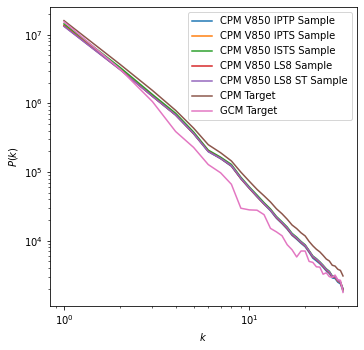

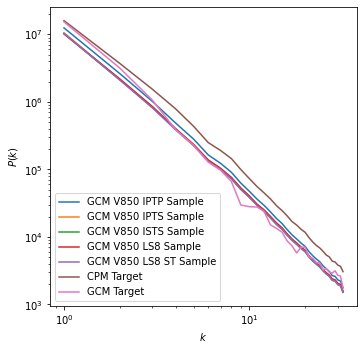

In [15]:
simulation_data = {"CPM Target": merged_ds.sel(source="CPM")["target_pr"], "GCM Target": merged_ds.sel(source="GCM")["target_pr"]}
ml_data = { f"{source} {model} Sample": merged_ds.sel(source=source, model=model)["pred_pr"] for model in merged_ds["model"].values for source in ["CPM"] }
plot_psd(ml_data | simulation_data)

simulation_data = {"CPM Target": merged_ds.sel(source="CPM")["target_pr"], "GCM Target": merged_ds.sel(source="GCM")["target_pr"]}
ml_data = { f"{source} {model} Sample": merged_ds.sel(source=source, model=model)["pred_pr"] for model in merged_ds["model"].values for source in ["GCM"] }
plot_psd(ml_data | simulation_data)

## Correlation